In [83]:
import sys
sys.path.append('..')

In [84]:
#local imports
from src.visualise.map_at_sub_la import *
from src.visualise.line_chart import line_chart, apply_standard_graph_styling 
from src.utils.constants import diverging_colour_scale
from src.visualise.map_at_sub_la import plot_map, plot_region_map, get_location_name_data
from analysis.utils import *
from OSAPI_keys import api_key

In [85]:
import geopandas as gpd
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.patheffects as pe
import pyodbc
import plotly.express as px 
from osdatahub import NGD, Extent

In [86]:
server = 'DAP-SQL01\CDS' 
database = 'Place'

# ENCRYPT defaults to yes starting in ODBC Driver 18. It's good to always specify ENCRYPT=yes on the client side to avoid MITM attacks.
cnxn = pyodbc.connect(driver='{SQL Server Native Client 11.0}', 
                      host=server, database=database, trusted_connection='yes')

In [87]:
#1. get timeseries of destination trips for all msoas, weekend trips only
# Note: Weekend dates have DATEPART = 6, Weekdays have DATEPART = 1.
query = '''
    SELECT start_date, end_msoa, SUM(avg_daily_trips) daily_trips
    FROM Process.tb_O2MOTION_ODMODE_Weekly
    WHERE DATEPART(dw, start_date) = 6
    GROUP BY start_date, end_msoa;
    '''

In [88]:
msoa_destination_trips = pd.read_sql_query(query, cnxn) 

D:\Users\sean.ogara\AppData\Local\Temp\1\ipykernel_7248\1393688363.py:1: UserWarning:

pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.



In [ ]:
# number of unique dates in the data, expecting 26 weekends when ingestion is finished
msoa_destination_trips['start_date'].nunique()

22

In [ ]:
# find average daily trips across series for each msoa and join average trips to full timeseries
avg_destination_trips = msoa_destination_trips.groupby(["end_msoa"]).mean().round(1).reset_index()
avg_destination_trips.rename(columns={"daily_trips": "avg_daily_trips"}, inplace=True)
msoa_destination_trips = pd.merge(left=msoa_destination_trips, right=avg_destination_trips, on="end_msoa")

D:\Users\sean.ogara\AppData\Local\Temp\1\ipykernel_7248\3703650043.py:2: FutureWarning: The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  avg_destination_trips = msoa_destination_trips.groupby(["end_msoa"]).mean().round(1).reset_index()


In [ ]:
# find ratio of daily trips / avg daily trips for each msoa and date
msoa_destination_trips.loc[:, 'ratio'] = msoa_destination_trips['daily_trips'] / msoa_destination_trips['avg_daily_trips']
msoa_destination_trips = msoa_destination_trips.sort_values(by=["end_msoa", "start_date"])
msoa_destination_trips
# find times where trips are above the yearly average by at least the threshold proportion
threshold = 0.5
seasonal_trips = msoa_destination_trips[msoa_destination_trips["daily_trips"] > msoa_destination_trips["avg_daily_trips"] * (1 + threshold)]
# Find peak across series for each MSOA
seasonal_trip_msoas = seasonal_trips.groupby(["end_msoa"]).max("ratio").reset_index().merge(seasonal_trips)
seasonal_trip_msoas

,end_msoa,daily_trips,avg_daily_trips,ratio,start_date
0,95AA01S1,7834,3121.3,2.509852,2023-01-07
1,95AA13S1,5536,3289.2,1.683084,2022-06-25
2,95AA16W1,2738,1653.0,1.656382,2022-08-20
3,95BB01S1,3488,2014.2,1.731705,2023-03-18
4,95BB03S1,2775,1815.6,1.528420,2022-07-09
...,...,...,...,...,...
367,W02000197,19293,11055.5,1.745104,2022-07-09
368,W02000224,16137,10630.3,1.518019,2022-11-26
369,W02000230,24134,12839.6,1.879654,2022-08-06
370,W02000251,21541,13844.0,1.555981,2022-07-09


<Axes: >

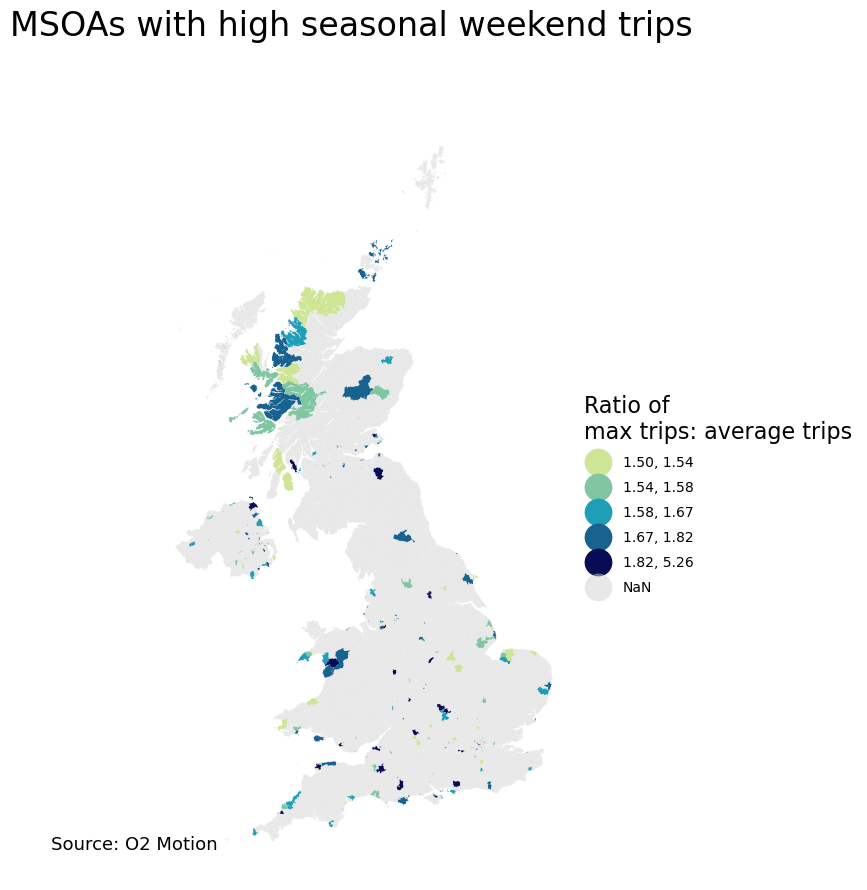

In [ ]:
# plot greatest peak weekend trips relative to avg in series
msoas = get_all_small_areas()
seasonal_trip_msoas.rename(columns={"end_msoa": "msoa11cd"}, inplace=True)
map_data = msoas.merge(seasonal_trip_msoas, how="left")

plot_map(map_data, 'ratio', plot_title="Ratio of\nmax trips: average trips", suptitle="MSOAs with high seasonal weekend trips", source="Source: O2 Motion",
             line_width=0, colour_scheme='quantiles')

In [ ]:
#2. example timeseries of select seasonal MSOAs
seasonal_msoas_dict = {
    "E02004178": "Woolacombe - SW",
    "W02000025": "Barnmouth - Wales",
    "E02002645": "Blackpool - NW"
}

example_seasonal_destinations = msoa_destination_trips.copy()
example_seasonal_destinations = example_seasonal_destinations[example_seasonal_destinations["end_msoa"].isin(seasonal_msoas_dict.keys())]
example_seasonal_destinations["msoa_name"] = example_seasonal_destinations["end_msoa"].map(seasonal_msoas_dict)
example_seasonal_destinations = example_seasonal_destinations.sort_values(by=["end_msoa", "start_date"])
example_seasonal_destinations

,start_date,end_msoa,daily_trips,avg_daily_trips,ratio,msoa_name
76170,2022-05-28,E02002645,10951,12280.0,0.891775,Blackpool - NW
76178,2022-06-11,E02002645,10813,12280.0,0.880537,Blackpool - NW
76165,2022-06-25,E02002645,11038,12280.0,0.898860,Blackpool - NW
76172,2022-07-09,E02002645,17576,12280.0,1.431270,Blackpool - NW
76175,2022-07-23,E02002645,12909,12280.0,1.051221,Blackpool - NW
...,...,...,...,...,...,...
197614,2023-01-21,W02000025,5138,6200.8,0.828603,Barnmouth - Wales
197610,2023-02-04,W02000025,5841,6200.8,0.941975,Barnmouth - Wales
197617,2023-02-18,W02000025,6218,6200.8,1.002774,Barnmouth - Wales
197607,2023-03-04,W02000025,5556,6200.8,0.896013,Barnmouth - Wales


In [ ]:
fig = line_chart(data=example_seasonal_destinations, fig_title="Ratio of daily trips to yearly average daily trips",x_col= "start_date", y_col="ratio", y_lab="Ratio", colour_col="msoa_name", colour_col_label="Msoa")
fig.update_layout(autosize=False, width=1600, height=800)

In [ ]:
#3. use 4 week rolling avg to smooth series

In [ ]:
#4 week rolling avg to smooth series (2 x 2 weekends) - example MSOAs
seasonal_destinations_rolling_ratio = example_seasonal_destinations.groupby(['end_msoa'])['ratio'].rolling(2, min_periods=1).mean().reset_index(level=0)
seasonal_destinations_rolling_ratio.rename(columns={"ratio": "4_week_rolling_ratio"}, inplace=True)
# merge with existing seasonal dataframe
example_seasonal_destinations = pd.merge(left=example_seasonal_destinations, right=seasonal_destinations_rolling_ratio['4_week_rolling_ratio'], left_index=True, right_index=True)

In [ ]:
# create line chart
fig = line_chart(data=example_seasonal_destinations, fig_title="Ratio of daily trips to yearly average daily trips",x_col= "start_date", y_col="4_week_rolling_ratio", y_lab="4 week rolling ratio", colour_col="msoa_name", colour_col_label="Msoa")
fig.update_layout( autosize=False, width=1600, height=800)
# add hlines for seasonal definitions
fig.add_hline(y=1.25, line_width=2, line_dash="dash", line_color="grey")
fig.add_hline(y=1.5, line_width=2, line_dash="dash", line_color="grey")


In [ ]:
#apply 4 week rolling avg method for all MSOAs
msoa_destination_trips_4_week_rolling_ratio = msoa_destination_trips.groupby(['end_msoa'])['ratio'].rolling(2, min_periods=1).mean().reset_index(level=0)
msoa_destination_trips_4_week_rolling_ratio.rename(columns={"ratio": "4_week_rolling_ratio"}, inplace=True)

In [ ]:
# merge with existing MSOA destination dataframe
msoa_destinations_plot_data = pd.merge(left=msoa_destination_trips, right=msoa_destination_trips_4_week_rolling_ratio['4_week_rolling_ratio'], left_index=True, right_index=True)
# find date at which peak occurs for each MSOA
msoa_destinations_plot_data = msoa_destinations_plot_data.loc[msoa_destinations_plot_data.groupby('end_msoa')['4_week_rolling_ratio'].idxmax()][['end_msoa', 'start_date', '4_week_rolling_ratio']]
# rename for plot code 
msoa_destinations_plot_data.rename(columns={"end_msoa": "msoa11cd"}, inplace=True)

<Axes: >

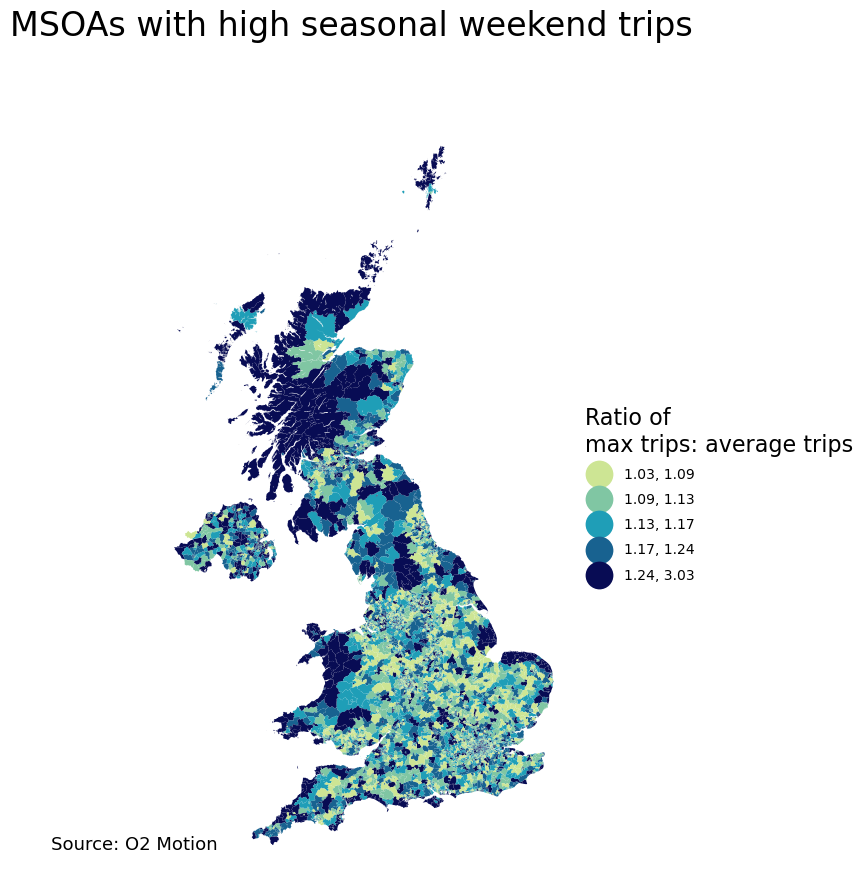

In [ ]:
# map of peak seasonality for all MSOAs
map_data = msoas.merge(msoa_destinations_plot_data)

plot_map(map_data, '4_week_rolling_ratio', plot_title="Ratio of\nmax trips: average trips", suptitle="MSOAs with high seasonal weekend trips", source="Source: O2 Motion",
             line_width=0, colour_scheme='quantiles')

In [ ]:
# find msoas with seasonal patterns, 25% and 50% plus above the long term average number of daily trips
msoa_destinations_plot_data.loc[:, "seasonal_flag"] = "Non-seasonal"
msoa_destinations_plot_data.loc[msoa_destinations_plot_data["4_week_rolling_ratio"] > (1.25), "seasonal_flag"] = "Seasonal"
msoa_destinations_plot_data.loc[msoa_destinations_plot_data["4_week_rolling_ratio"] > (1 + threshold), "seasonal_flag"] = "Highly seasonal"

<Axes: >

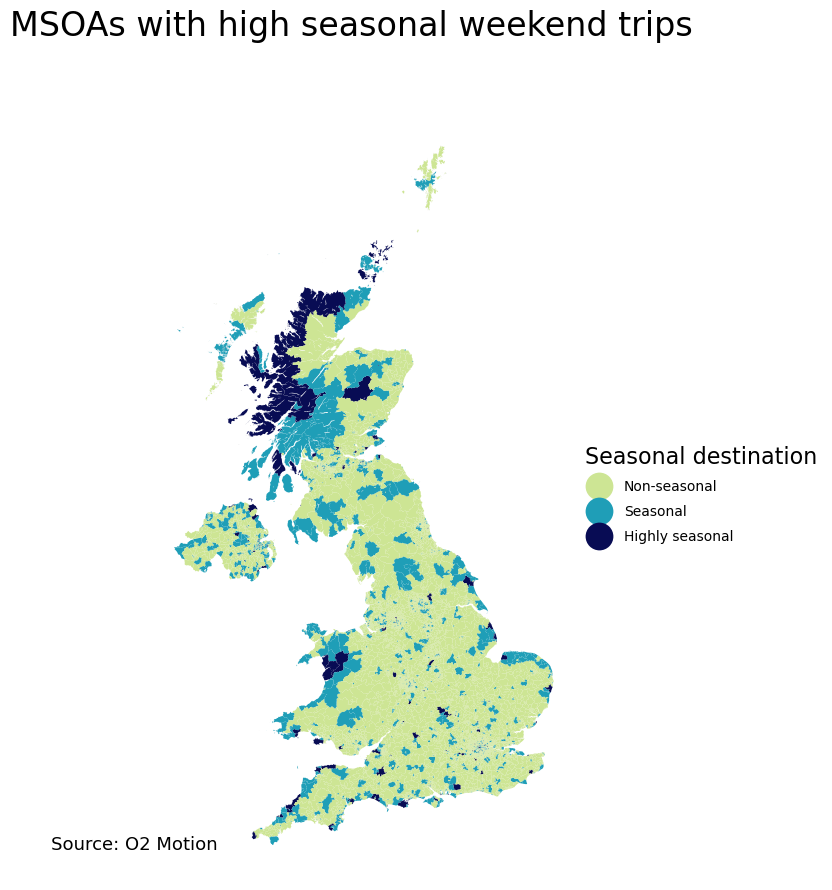

In [ ]:
map_data = msoas.merge(msoa_destinations_plot_data)

plot_map(map_data, 'seasonal_flag', plot_title="Seasonal destination", suptitle="MSOAs with high seasonal weekend trips", source="Source: O2 Motion",
             line_width=0, colour_scheme=None, cat_data=True, ordered_categories=["Non-seasonal", "Seasonal", "Highly seasonal"])

In [ ]:
# 3. create seasonality by region maps
regions = gpd.read_file("Q:\SDU\Mobility\Data\Boundaries\ITL1_MAY_2021\ITL1_MAY_2021_UK_BUC.shp")

In [ ]:
# remove (England) in names
regions["ITL121NM"] = regions["ITL121NM"].str.replace(r"[()]", "").str.replace(" England", "")

D:\Users\sean.ogara\AppData\Local\Temp\1\ipykernel_7248\2649925078.py:2: FutureWarning:

The default value of regex will change from True to False in a future version.



In [ ]:
# Define the lists of locations
# towns to keep from OS API list
towns_to_add = [
    "Wooler",
    "Coldstream",
    "Selkirk",
    "Stanhope",
    "Blyth",
    "Stockton-on-Tees",
    "Darlington",
    "Hastings",
    "Shrewsbury",
    "Whitby",
    "Keswick",
    "Silloth",
    "Skipton",
    "Wetherby",
    "Widnes",
    "Blaenau Ffestiniog",
    "Formby",
    "Blackpool",
    "Scarborough",
    "Bridlington",
    "Northallerton",
    "Mablethorpe",
    "Skegness",
    "Hunstanton",
    "Towcester",
    "Alcester",
    "Telford",
    "Fakenham",
    "Stevenage",
    "Southwold",
    "Rye",
    "Bishop's Waltham",
    "Porthcawl",
    "Ilfracombe",
    "Salcombe",
    "Torquay",
    "St Ives",
    "Bridport",
    "Newquay",
    "Perranporth",
    "Bude",
    "Swanage",
    "Aberystwyth",
    "Porthmadog",
    "Pwllheli",
    "Amlwch",
    "Llandudno",
    "Betws-y-Coed",
    "Aberhonddu",
    "Llanymddyfri",
    "Pontarddulais",
    "Penfro",
    "Abercych",
    "Tyddewi",
    "Y Bala",
    "Harlech",
    "Tywyn",
    "Dolgellau",
    "Wrexham",
    "Caerphilly",
    "Thurso",
    "Stromness",
    "Stornoway",
    "Oban",
    "Tobermory",
    "New Galloway",
    "Aviemore",
    "An Gearasdan",
    "Mumbles"
]

# City names to remove to prevent overcrowding
cities_to_remove = [
    "City of London",
    "City of Westminster",
    "Winchester",
    "St Albans",
    "Casnewydd",
    "Salford",
    "Dunfermline",
    "Bradford"
]

# Call the function with your data and lists
names_gdf = get_location_name_data(api_key, towns_to_add, cities_to_remove, regions)

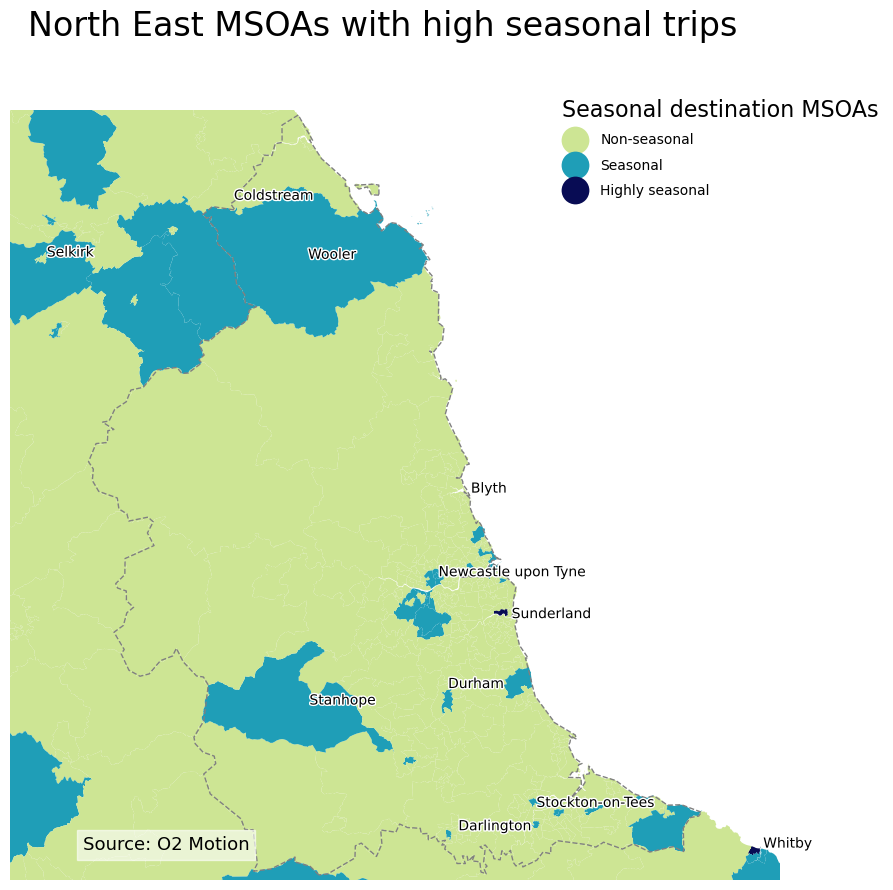

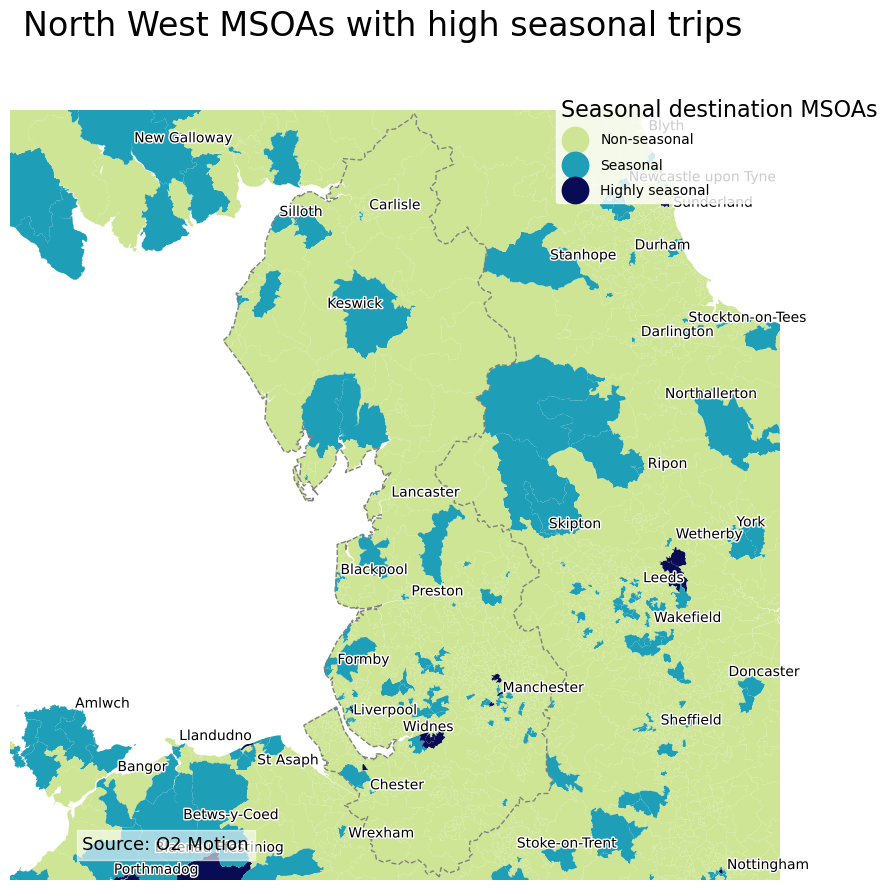

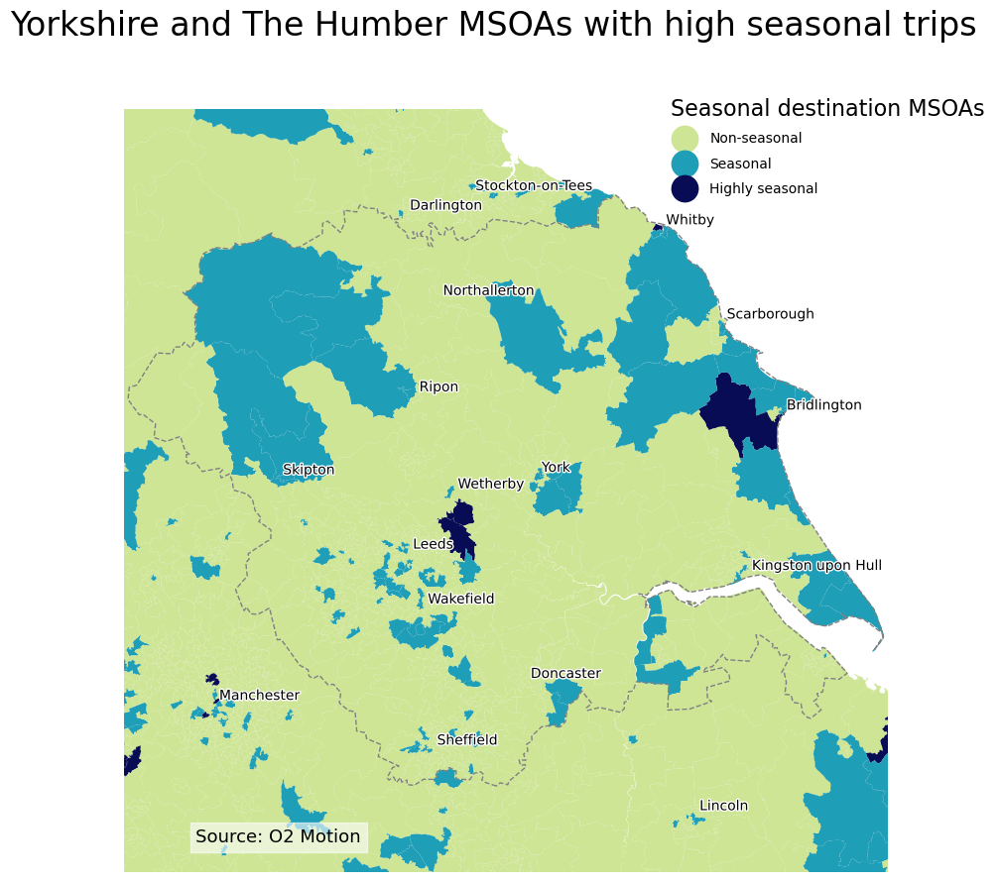

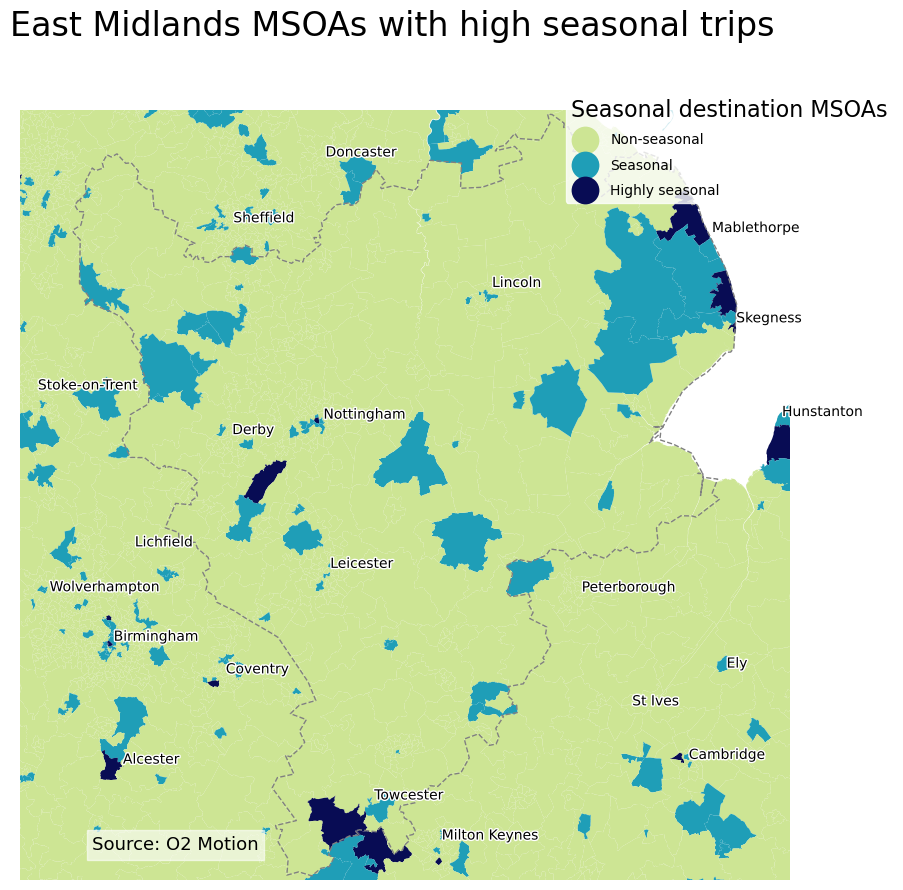

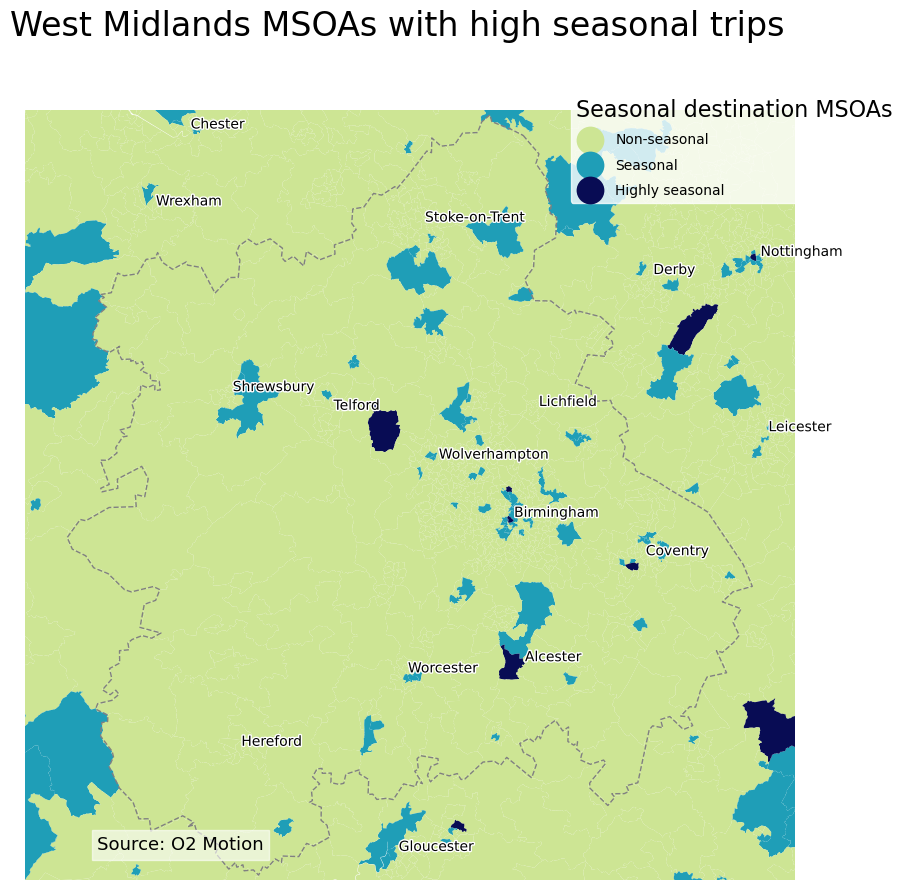

...

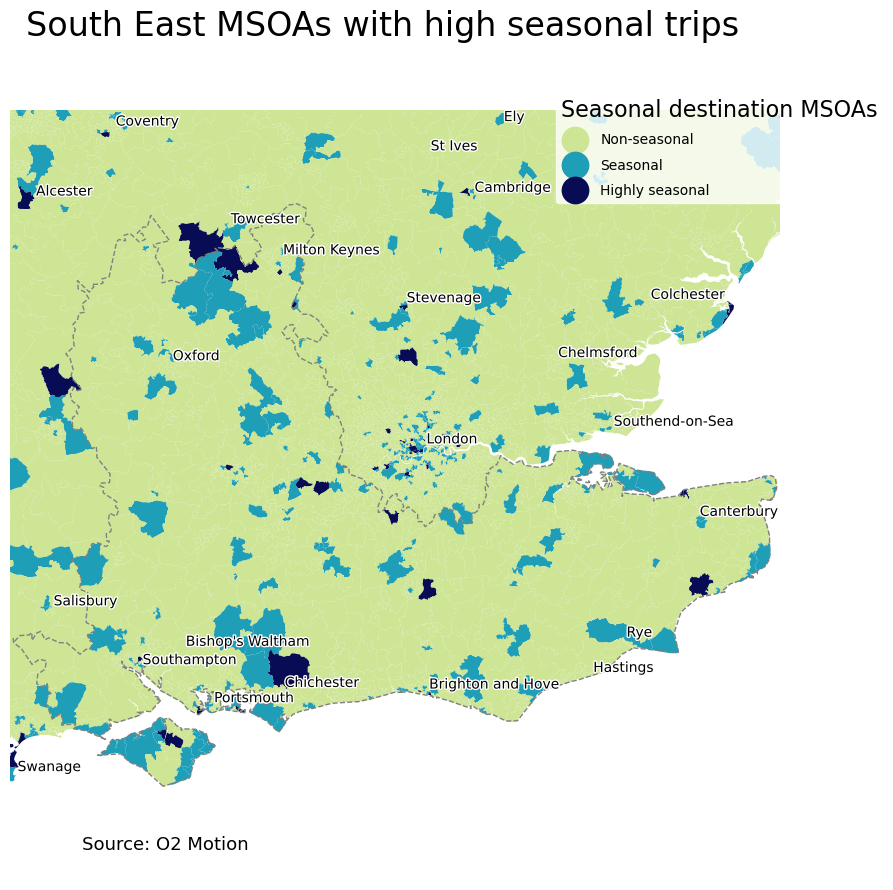

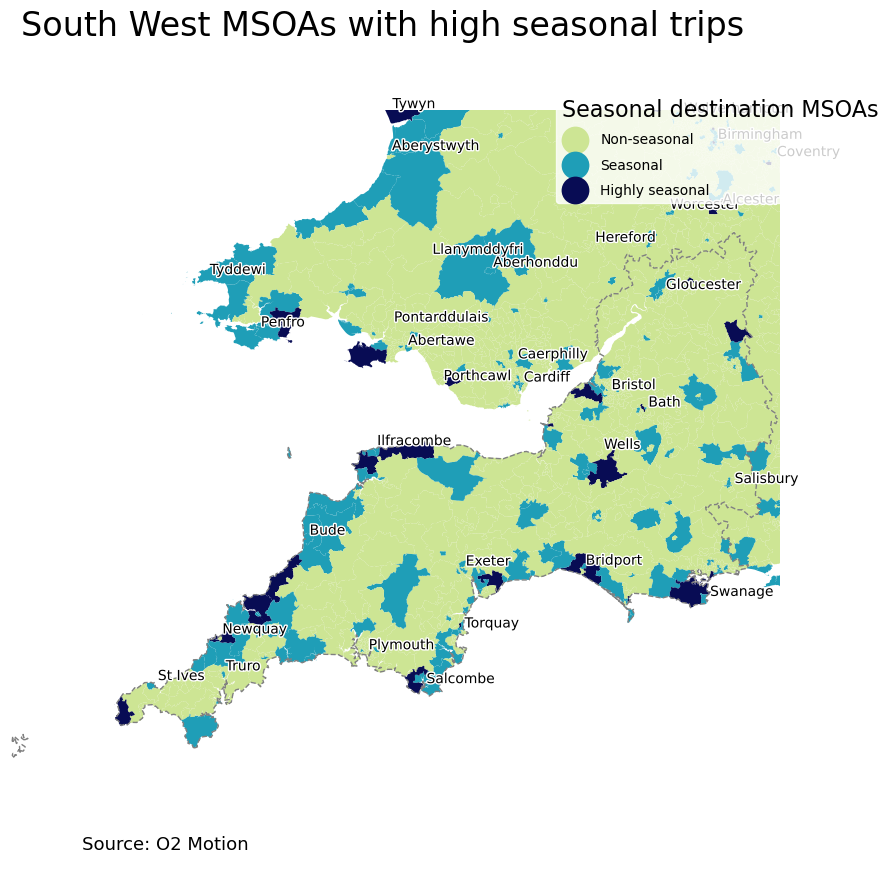

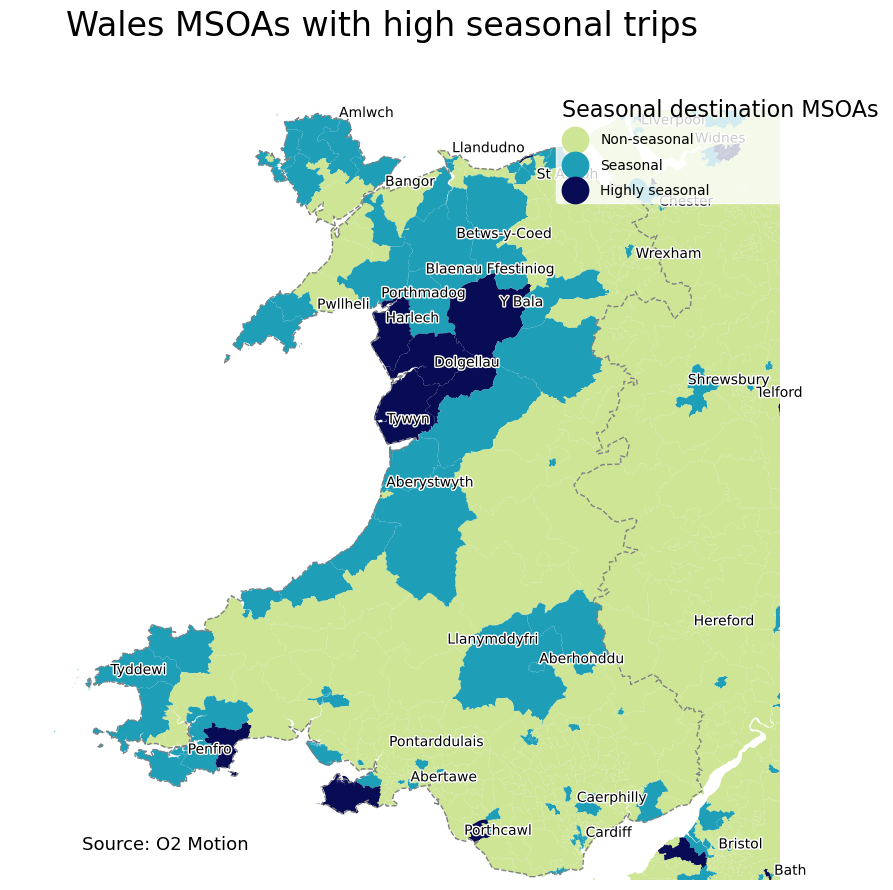

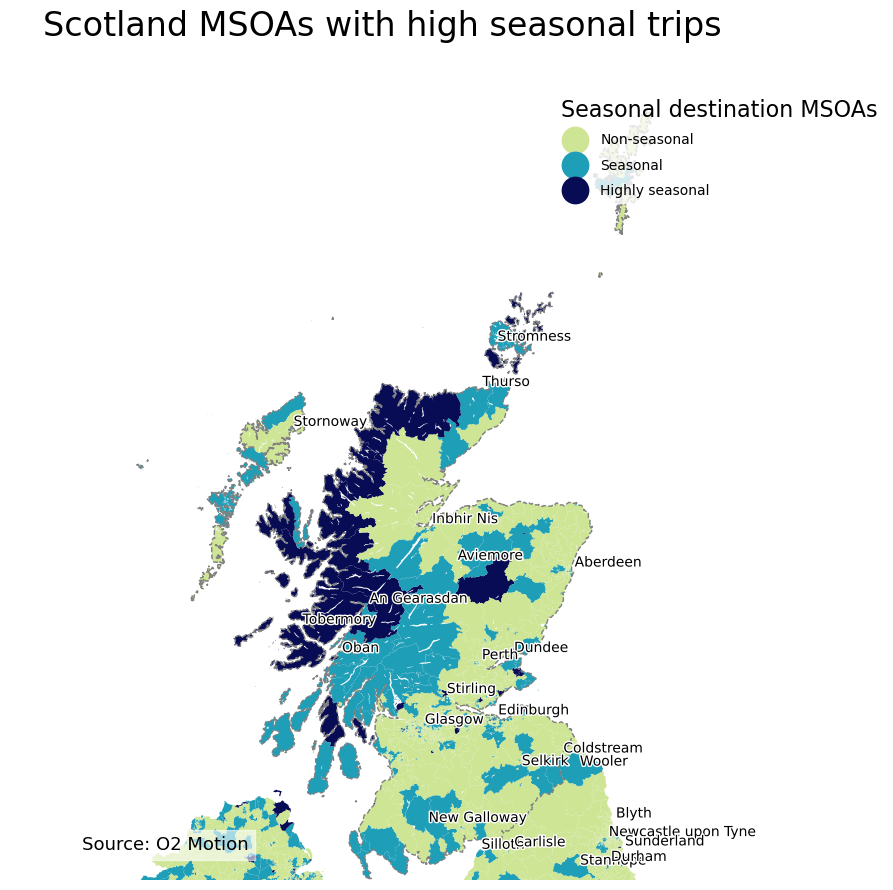

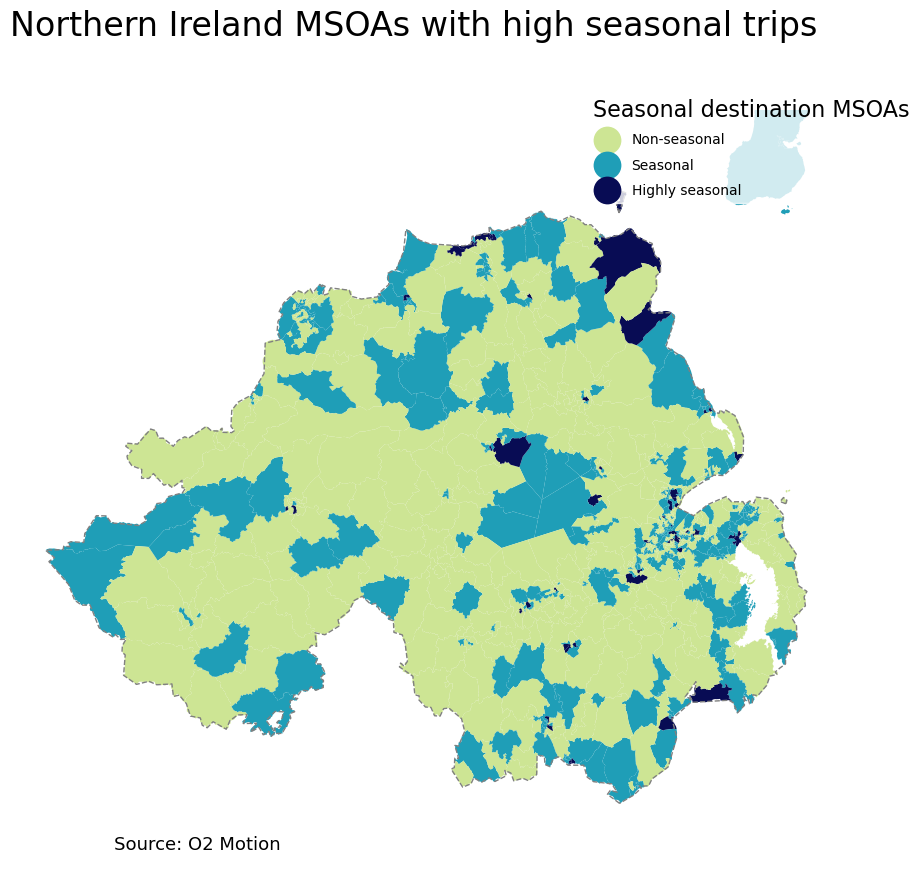

In [ ]:
# plot maps
region_names =  list(pd.unique(regions["ITL121NM"]))
map_data = msoas.merge(msoa_destinations_plot_data)

for region_name in region_names:
    plot_region_map(map_data, region_name, regions, 'seasonal_flag', plot_title= "Seasonal destination MSOAs" , suptitle=region_name + " MSOAs with high seasonal trips", source="Source: O2 Motion",
             line_width=0, colour_scheme=None, cat_data=True, ordered_categories=["Non-seasonal", "Seasonal", "Highly seasonal"], place_names=names_gdf)

In [ ]:
#4. plot when peaks occur for each seasonal msoa - are there any winter peaking places

In [ ]:
fig = px.histogram(
                    msoa_destinations_plot_data[msoa_destinations_plot_data["seasonal_flag"].isin(["Highly seasonal"])], 
                    x="start_date", 
                    title="Peak mobility months for seasonal MSOAs", 
                    color_discrete_sequence=diverging_colour_scale,
                    labels={
                        "count": "Counthgf"
                    })
fig.update_xaxes(ticklabelmode="period", dtick="M1", tickformat="%b\n%Y")
apply_standard_graph_styling(fig)
fig.update_layout(
    yaxis_title_text='Count of peaks',
    bargap=0.1, 
    height=1000
)
fig.show()

In [ ]:
# create winter/summer binary variable and plot maps by region
winter_months = [10, 11, 12, 1, 2, 3]
summer_months = [4, 5, 6, 7, 8, 9]
msoa_destinations_plot_data["start_date"] = pd.to_datetime(msoa_destinations_plot_data["start_date"])
msoa_destinations_plot_data.loc[:, "season_peak_flag"] = "Non-seasonal"
msoa_destinations_plot_data.loc[(msoa_destinations_plot_data["start_date"].dt.month.isin(winter_months)) & (msoa_destinations_plot_data["seasonal_flag"] != "Non-seasonal"), "season_peak_flag"] = "Winter peak"
msoa_destinations_plot_data.loc[(msoa_destinations_plot_data["start_date"].dt.month.isin(summer_months)) & (msoa_destinations_plot_data["seasonal_flag"] != "Non-seasonal"), "season_peak_flag"] = "Summer peak"


In [ ]:
def plot_map(data_to_plot: gpd.GeoDataFrame, 
             data_column: str, 
             plot_title: str = "", 
             suptitle: str = "", 
             source: str = "", 
             bbox_anchor: tuple = (1, 0.5), 
             loc: str = 'center left', 
             line_width: float = 0.4, 
             colour_scheme: str = 'equalinterval', 
             REVERSE_SCALE: bool = False, 
             cat_data: bool = False, 
             ordered_categories: list = None,
             colour_map: list = None) -> plt.Axes:
    """
    Create a thematic map plot.

    Args:
        data_to_plot (gpd.GeoDataFrame): The GeoDataFrame containing the data to be plotted.
        data_column (str): The column in the GeoDataFrame to use for coloring the map.
        plot_title (str, optional): Title for the plot. Defaults to an empty string.
        suptitle (str, optional): Super title for the plot. Defaults to an empty string.
        source (str, optional): Data source information. Defaults to an empty string.
        bbox_anchor (tuple, optional): Bounding box anchor for the legend. Defaults to (1, 0.5).
        loc (str, optional): Location of the legend. Defaults to 'center left'.
        line_width (float, optional): Width of lines in the map. Defaults to 0.4.
        colour_scheme (str, optional): Color scheme for the map. Defaults to 'equalinterval'.
        REVERSE_SCALE (bool, optional): Reverse the color scale. Defaults to False.
        cat_data (bool, optional): Whether the data is categorical. Defaults to False.
        ordered_categories (list, optional): Ordered categories for categorical data. Defaults to None.
        colour_map (list, optional): List of colours for map. Defaults to None.

    Returns:
        plt.Axes: The map plot.

    """
    fig, ax = plt.subplots(figsize=(10, 10))

    if not colour_map:
        cmap = ListedColormap(map_lu_partnership_colour_scale)
    else:
        cmap = ListedColormap(colour_map)
    
    if REVERSE_SCALE:
        cmap = ListedColormap(map_lu_partnership_colour_scale_rev)
    
    our_plot = data_to_plot.plot(
        column=data_column,
        edgecolor='k',
        linewidth=line_width,
        cmap=cmap,
        legend=True,
        scheme=colour_scheme,
        categorical=cat_data,
        categories=ordered_categories,
        k=5,
        legend_kwds={'bbox_to_anchor': bbox_anchor, 'loc': loc, 'markerscale': 2, 'title': plot_title, 'title_fontsize': 16, 'labelspacing': 0.8, 'edgecolor': 'white'},
        missing_kwds= {'color': 'lightgrey', 'alpha': 0.5},
        ax=ax
    )
    
    plt.axis('off')
    fig.suptitle(suptitle, fontsize=24)
    
    # Get the legend object
    legend = ax.get_legend()
    legend._legend_box.align = "left"
    fig.text(0.2, 0.14, source, fontsize=13, backgroundcolor=(1, 1, 1, 0.6))
    
    return our_plot


def get_square_bounds_coords(area_bounds: pd.DataFrame) -> tuple:
    """
    Calculate the coordinates of a square bounding box within a given area.

    This function takes a DataFrame `area_bounds` representing the bounding box of an area
    and returns the coordinates of a square bounding box within that area. The square bounding box is
    determined by finding the center of the given area and then creating a square bounding box based
    on the axis with the largest span.
    
    Parameters:
    area_bounds (pandas.DataFrame): A DataFrame containing the bounding box coordinates
        with columns 'minx', 'maxx', 'miny', and 'maxy'. Created using the .bounds attribute
        of a GeoPandas DataFrame. E.g. region_bounds = region_gdf.bound

    Returns:
    tuple: A tuple (x_min, y_min, x_max, y_max) representing the coordinates of the square bounding box.
    x_min (float): The minimum x-coordinate of the square.
    y_min (float): The minimum y-coordinate of the square.
    x_max (float): The maximum x-coordinate of the square.
    y_max (float): The maximum y-coordinate of the square.
    """
    area_center_x = (area_bounds.iloc[0]["maxx"] + area_bounds.iloc[0]["minx"]) / 2
    area_center_y = (area_bounds.iloc[0]["maxy"] + area_bounds.iloc[0]["miny"]) / 2
    x_min, x_max = area_bounds.iloc[0]["minx"], area_bounds.iloc[0]["maxx"]
    y_min, y_max = area_bounds.iloc[0]["miny"], area_bounds.iloc[0]["maxy"]
    area_x_span = x_max - x_min
    area_y_span = y_max - y_min
    if area_x_span > area_y_span:
        y_min = area_center_y - area_x_span / 2
        y_max = area_center_y + area_x_span / 2
    else: 
        x_min = area_center_x - area_y_span / 2
        x_max = area_center_x + area_y_span / 2
    return x_min, y_min, x_max, y_max


def plot_region_map(data_to_plot: gpd.GeoDataFrame, region_name: str, regions_gdf: gpd.GeoDataFrame,
                    data_column: str, plot_title: str = "", suptitle: str = "", source: str = "",
                    bbox_anchor: tuple = (0.70, 0.95), loc: str = 'center left', line_width: float = 0.4,
                    colour_scheme: str = 'equalinterval', REVERSE_SCALE: bool = False,
                    cat_data: bool = False, ordered_categories: list = None, 
                    place_names: gpd.GeoDataFrame = None,
                    colour_map: list = None) -> plt.Figure:
    """
    Plot a regional map with data.

    Args:
        data_to_plot (GeoDataFrame): GeoDataFrame containing data to plot.
        region_name (str): Name of the region to plot.
        regions_gdf (GeoDataFrame): GeoDataFrame containing region geometries.
        data_column (str): The column in data_to_plot to use for coloring the map.
        plot_title (str, optional): Title for the map. Defaults to an empty string.
        suptitle (str, optional): Supertitle for the map. Defaults to an empty string.
        source (str, optional): Source information for the map. Defaults to an empty string.
        bbox_anchor (tuple, optional): Bounding box anchor. Defaults to (0.70, 0.95).
        loc (str, optional): Location of the legend. Defaults to 'center left'.
        line_width (float, optional): Line width for the map. Defaults to 0.4.
        colour_scheme (str, optional): Color scheme for the map. Defaults to 'equalinterval'.
        REVERSE_SCALE (bool, optional): Reverse the color scale. Defaults to False.
        cat_data (bool, optional): Categorize the data. Defaults to False.
        ordered_categories (list, optional): Ordered categories for the legend. Defaults to None.
        place_names(GeoDataFrame, optional): GeoDataFrame containing place names to plot.
        colour_map (list, optional): List of colours for map. Defaults to None.

    Returns:
        plt.Figure: The generated plot.

    Example usage:
    plot_region_map(map_data, "North East", regions, 'seasonal_flag',
                   plot_title="Seasonal destination MSOAs",
                   suptitle="North East MSOAs with high seasonal trips",
                   source="Source: O2 Motion",
                   line_width=0,
                   colour_scheme=None,
                   cat_data=True,
                   ordered_categories=["Non-seasonal", "Seasonal", "Highly seasonal"]
                   place_names=names_gdf)
    """
    plot = plot_map(data_to_plot, data_column, plot_title, suptitle, source, bbox_anchor, loc,
                    line_width, colour_scheme, REVERSE_SCALE, cat_data, ordered_categories, colour_map)

    ax = plt.gca()

    region_gdf = regions_gdf.loc[regions_gdf["ITL121NM"] == region_name]
    region_gdf.boundary.plot(
        edgecolor = 'grey', 
        linewidth = 1,
        linestyle='--',
        ax=ax
    )

    # Set regional bounding box
    region_bounds = region_gdf.bounds
    x_min, y_min, x_max, y_max = get_square_bounds_coords(area_bounds=region_bounds)
    ax.set_xlim(x_min - 1000, x_max + 1000)
    ax.set_ylim(y_min - 1000, y_max + 1000)

    if place_names is not None:
        for x, y, label in zip(place_names.geometry.x, place_names.geometry.y, place_names.name1_text):
            ax.annotate(label, xy=(x, y), xytext=(3, 3), textcoords="offset points",
                        path_effects=[pe.withStroke(linewidth=2, foreground="white")])

    return plot

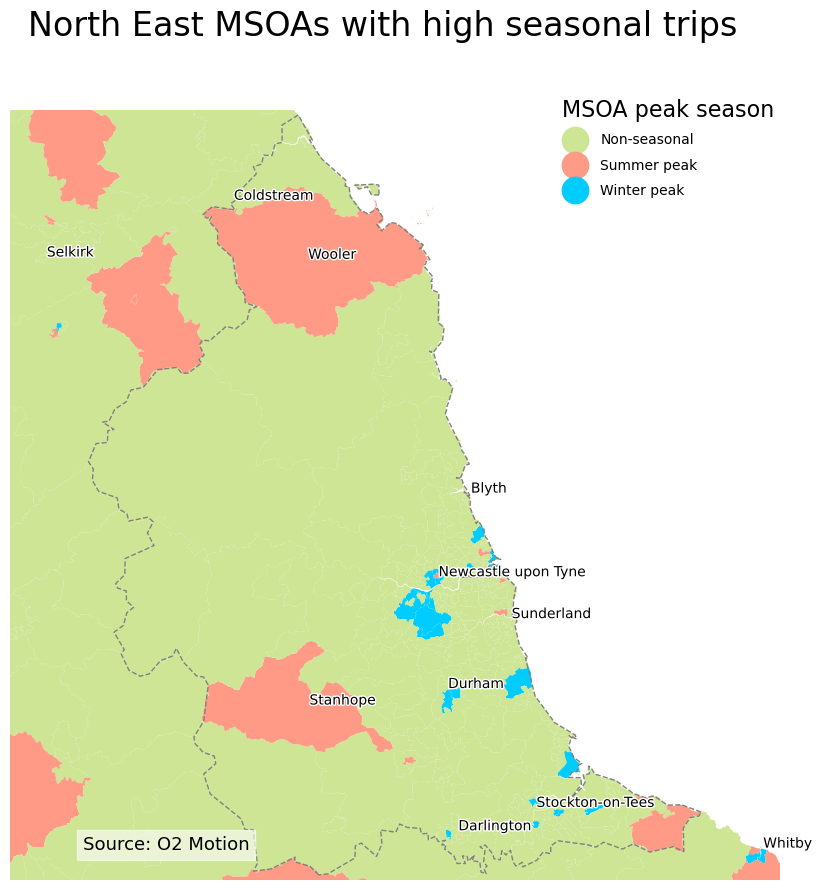

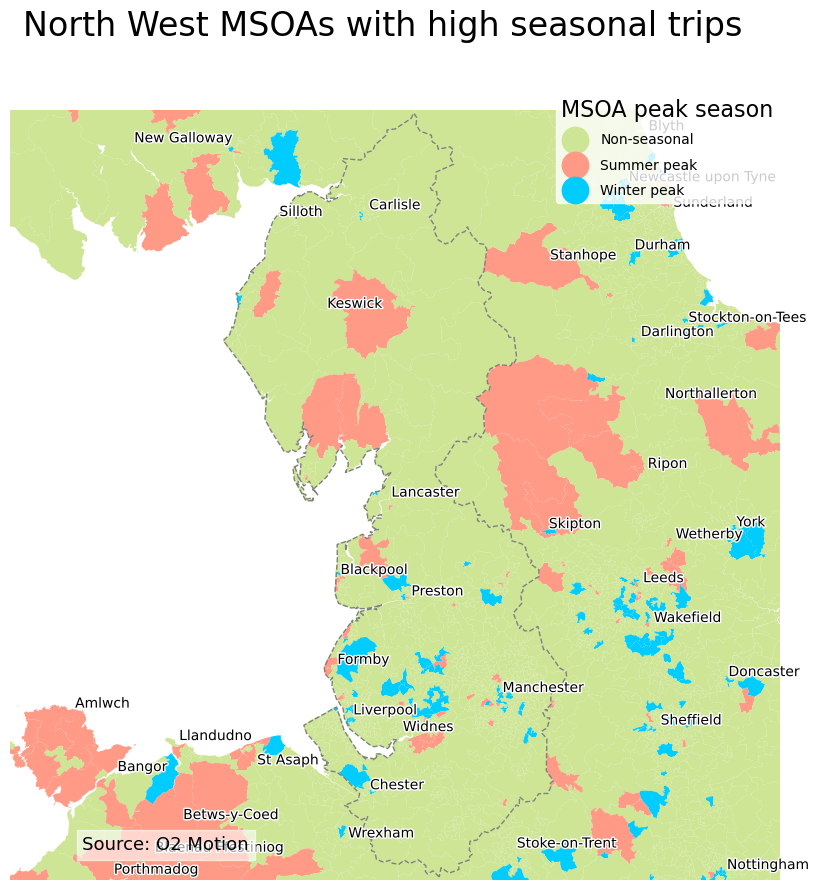

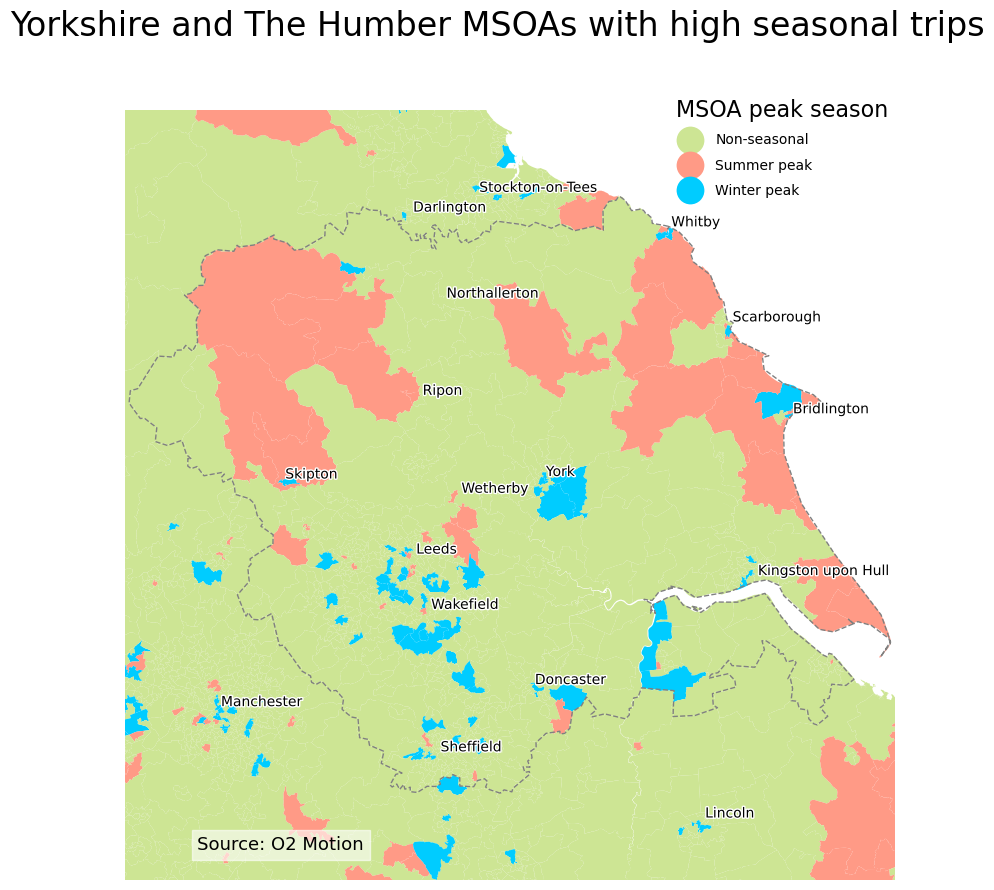

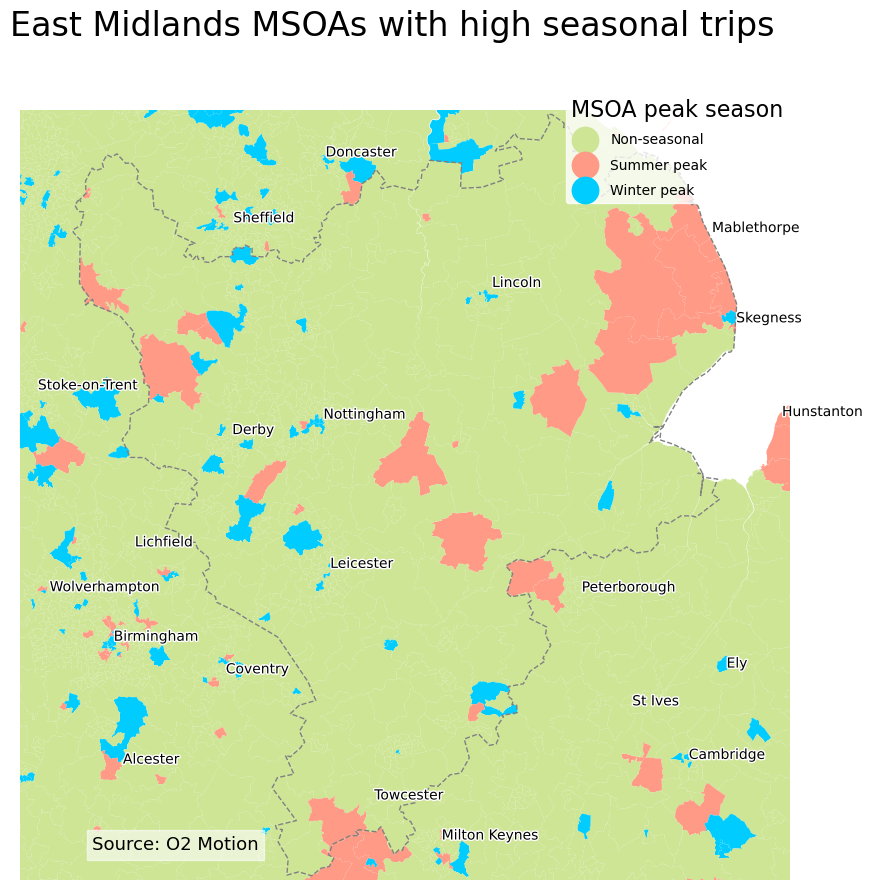

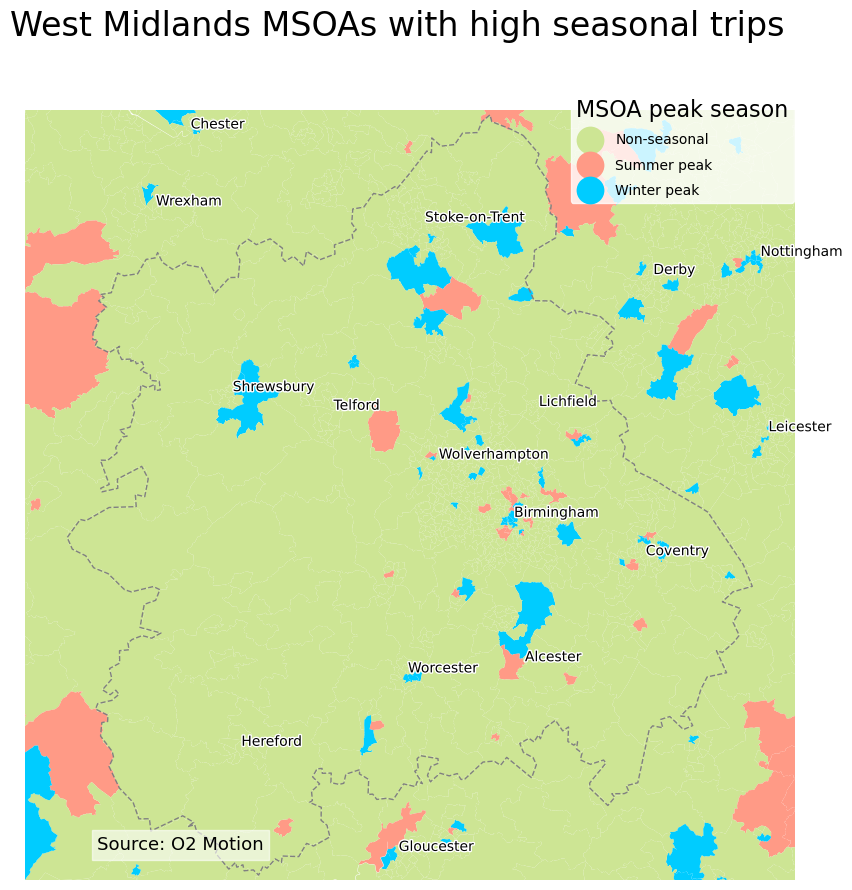

...

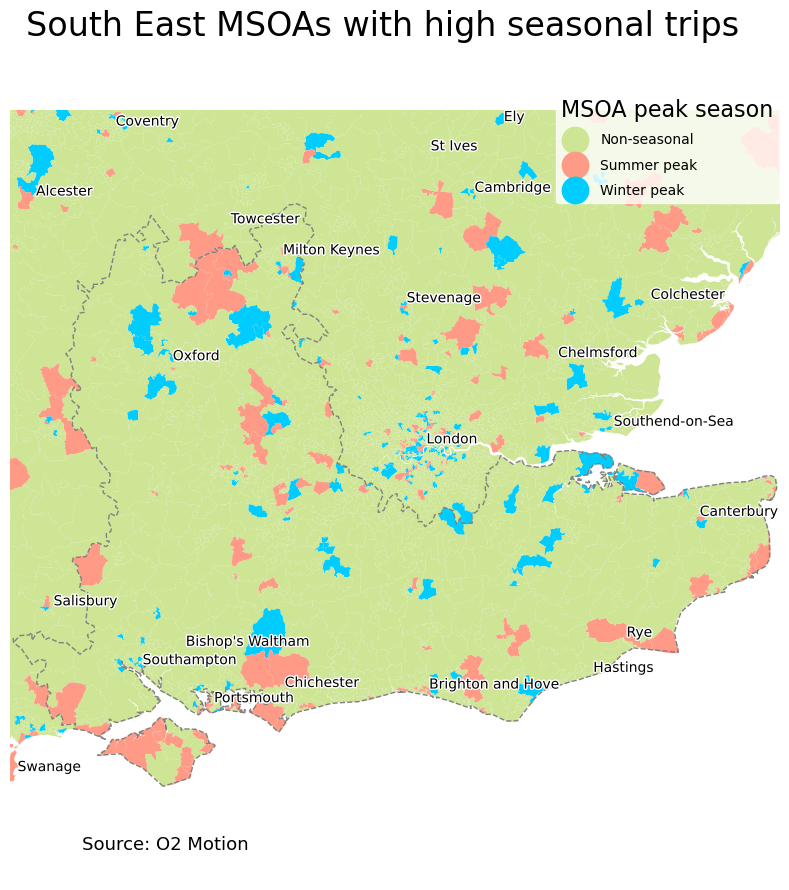

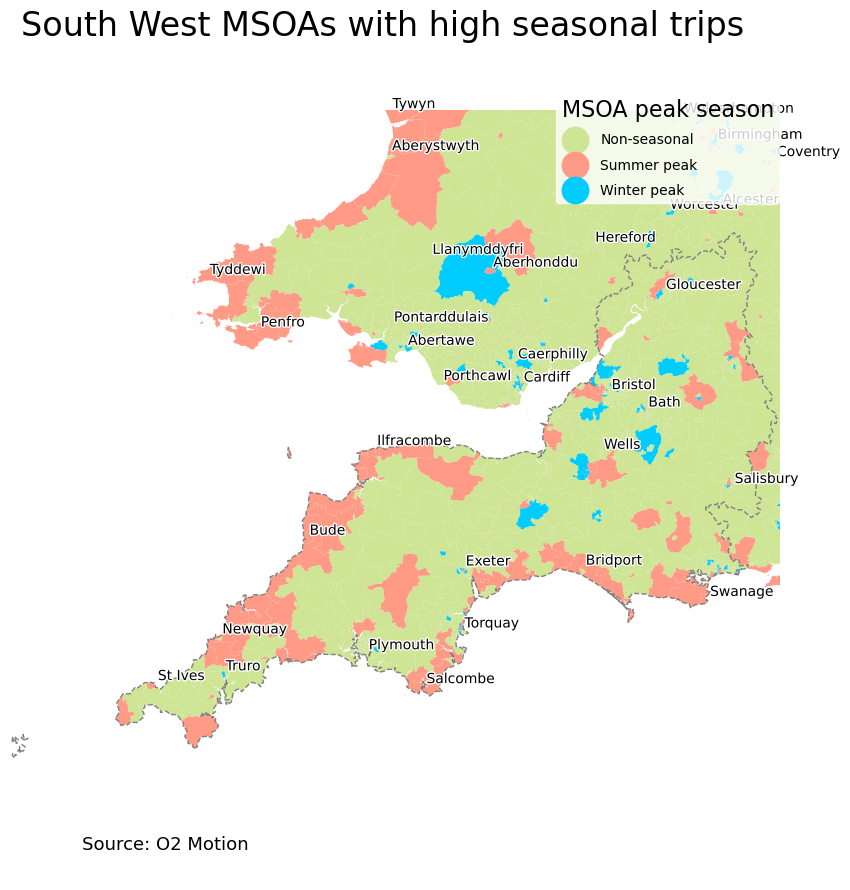

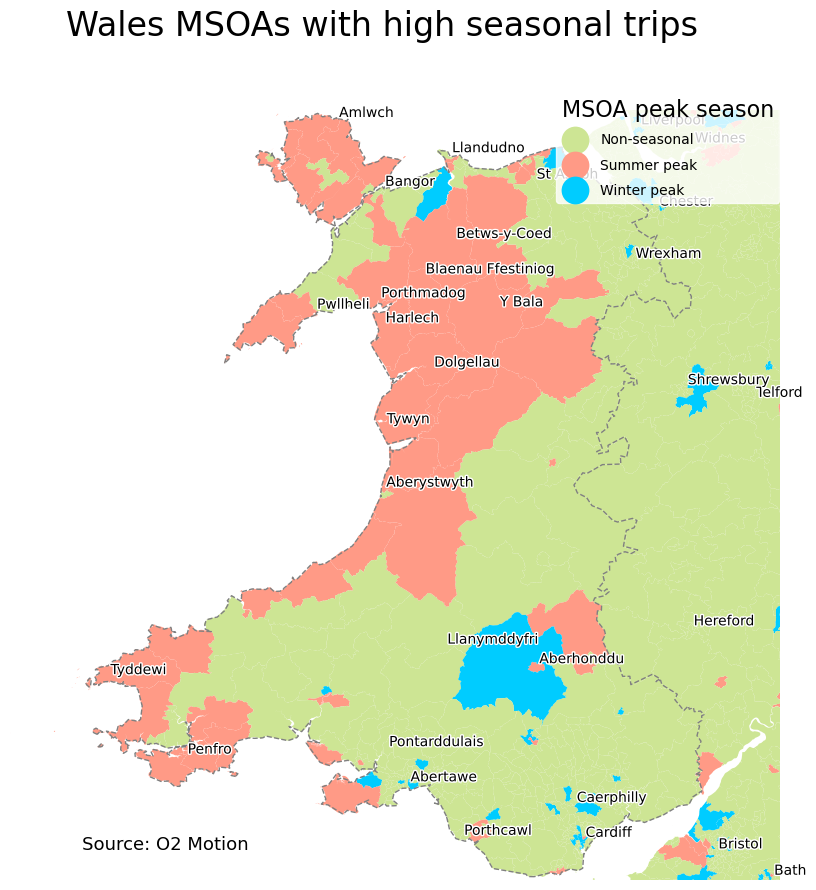

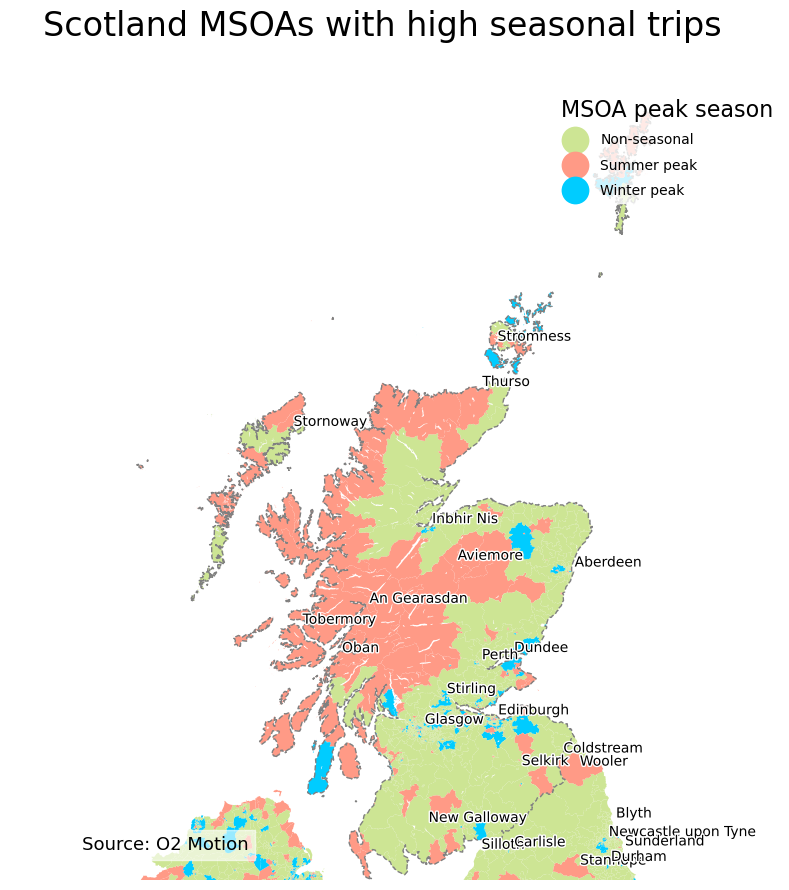

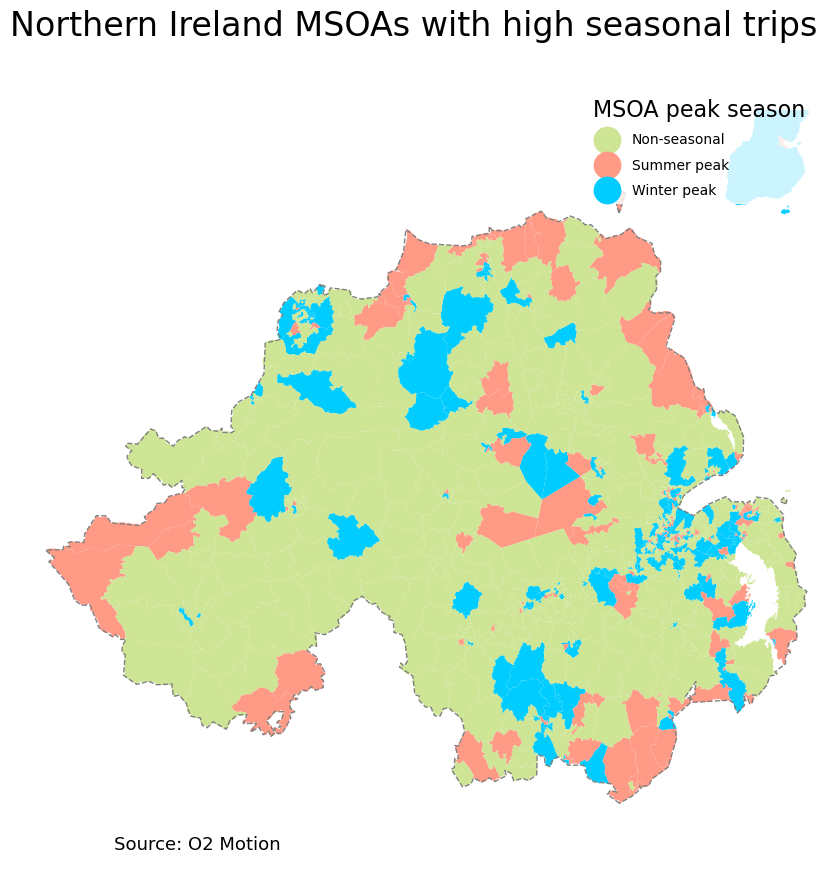

In [ ]:
map_data = msoas.merge(msoa_destinations_plot_data)

for region_name in region_names:
    plot_region_map(map_data, region_name, regions, 'season_peak_flag', plot_title= "MSOA peak season" , suptitle=region_name + " MSOAs with high seasonal trips", source="Source: O2 Motion",
             line_width=0, colour_scheme=None, cat_data=True, ordered_categories=["Non-seasonal", "Summer peak", "Winter peak"], place_names=names_gdf, colour_map=["#CDE594" , "#FF9A86", "#00CCFF"])